# Homework 1.

Salette Guadalupe Noemi Villalobos A01246619

Erick Hernández Silva A01750170

Israel Sánchez Miranda A01378705

Loading imports and necessary libraries.

In [2]:
import cv2                                          # For image processing and image/video capture
import time                                         # For time recording and time operations
import numpy as np                                  # For complex mathematical operations
import matplotlib.pyplot as plt                     # For image plotting
from scipy.signal import convolve2d                 # For 2D convolutions
from scipy.ndimage import gaussian_laplace          # For Laplacian of Gaussian filter
from skimage.restoration import denoise_bilateral   # For anisotropic filtering

## Memory and Color.

Firstly we define a cell for capturing video, running the following cell wil open a video capture window to take a picture using the space key. The image will save using the timestamp when it was taken. Sample images are already loaded in the notebook but it is possible to take several others using this cell.

In [2]:
cam = cv2.VideoCapture(0)
cv2.namedWindow('Camera')

while(True):
    ret, frame = cam.read()
    # Display the captured image
    cv2.imshow('Camera', frame) 
    # Save on pressing 'space' key 
    key = cv2.waitKey(1)
    if key%256 == 32:
        img_name = f'capture_{time.time()}.png'
        cv2.imwrite(img_name, frame)
        cv2.destroyAllWindows()
        break

cam.release()

Then we use the pre-loaded images to show how they look, changing the path at the `imread()` can load other images.

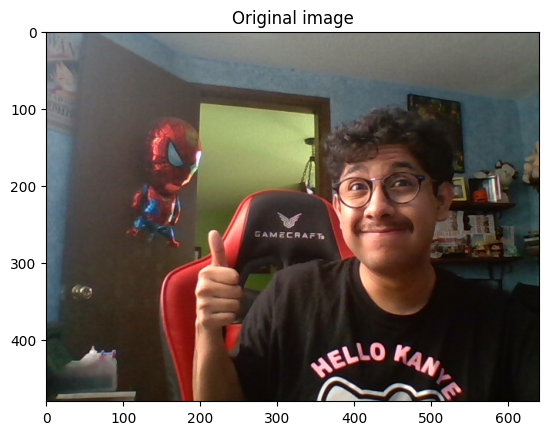

In [10]:
img = cv2.imread('capture_1723752477.6892214.png')

# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

### RGB channel tuning.

The following cells can modify any of the RGB channels of the image and change its value to have different results. Changing the value of `diff_red_img[:, :, x]` has different results; `x` is the RGB channel to change with `0` being red, `1` green and `2` blue. We first change the red channel: 

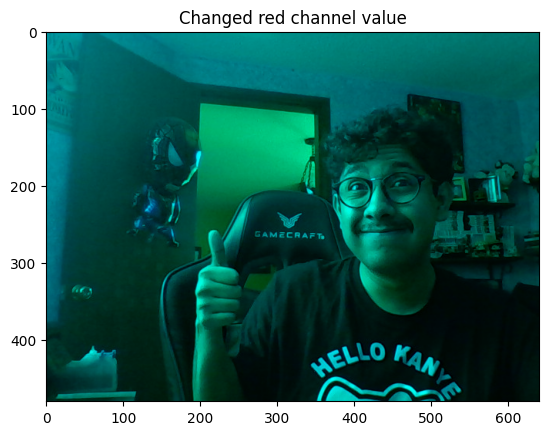

In [11]:
diff_red_img = np.copy(img)

# Create filter, change = 0 value as needed
diff_red_img[:, :, 0] = 0

plt.imshow(diff_red_img)
plt.title('Changed red channel value')
plt.show()

Then the green:

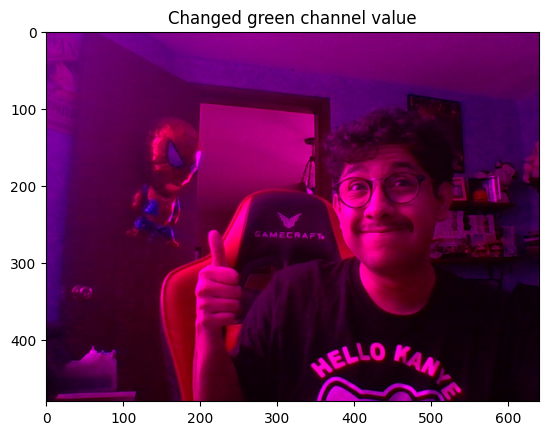

In [12]:
diff_green_img = np.copy(img)

# Create filter, change = 0 value as needed
diff_green_img[:, :, 1] = 0

plt.imshow(diff_green_img)
plt.title('Changed green channel value')
plt.show()

And finally the blue:

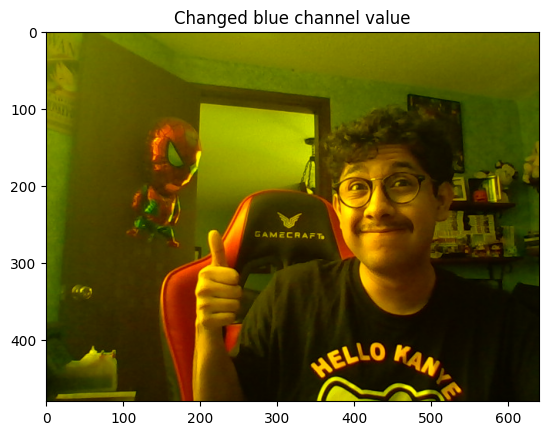

In [13]:
diff_blue_img = np.copy(img)

# Create filter, change = 0 value as needed
diff_blue_img[:, :, 2] = 0

plt.imshow(diff_blue_img)
plt.title('Changed blue channel value')
plt.show()

It is also possible to plot each RGB channel individually. The following cell extracts the specified channel (`0` for red, `1` for green and `2` for blue) and plots the channel using `matplotlib.pyplot`.

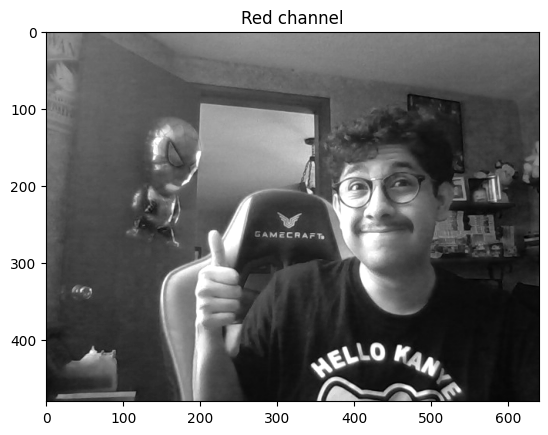

In [14]:
diff_rgb_img = np.copy(img)

# Create filter, change channel as needed
# 0 for R, 1 for G and 2 for B
channel = 0
display_channel = diff_rgb_img[:, :, channel]

channel_name = ''
match channel:
  case 0:
    channel_name = 'Red'
  case 1: 
    channel_name = 'Green'
  case 2: 
    channel_name = 'Blue'

plt.imshow(display_channel, cmap='gray')
plt.title(f'{channel_name} channel')
plt.show()

It is also possible to see al separated channels at once with their respective colors by making a copy of each channel and displaying its RGB version.

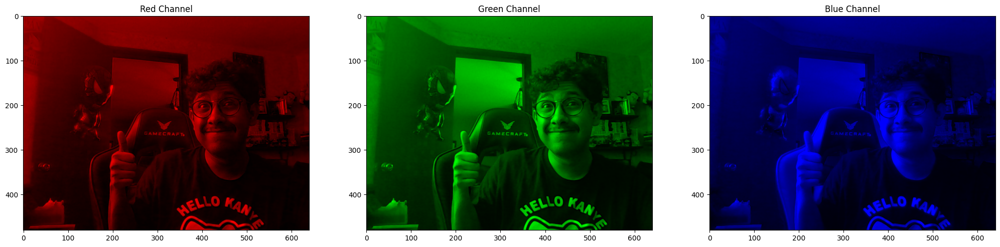

In [15]:
zeros = np.zeros_like(img)

# Blue channel
blue_image = zeros.copy()
blue_image[:, :, 0] = img[:, :, 0]

# Green channel
green_image = zeros.copy()
green_image[:, :, 1] = img[:, :, 1]

# Red channel
red_image = zeros.copy()
red_image[:, :, 2] = img[:, :, 2]

# Display the channels
plt.figure(figsize=(25, 15))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(red_image, cv2.COLOR_BGR2RGB))
plt.title('Red Channel')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(green_image, cv2.COLOR_BGR2RGB))
plt.title('Green Channel')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(blue_image, cv2.COLOR_BGR2RGB))
plt.title('Blue Channel')

# Show all channels
plt.show()

### Grayscale images.

We convert the RGB image to its grayscale version using the `cv2.cvtColor()` function and the `cv2.COLOR_RGB2GRAY` property. 

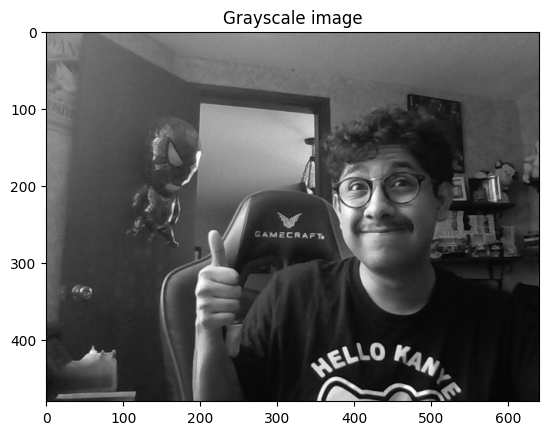

In [16]:
grayscale_img = np.copy(img)

# Converting to grayscale
grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plt.imshow(grayscale_img, cmap='gray')
plt.title('Grayscale image')
plt.show()

It is also possible to obtain the negative image by inverting the grayscale image. This is achieved by substracting 255 to the whole image to obtain its complement.

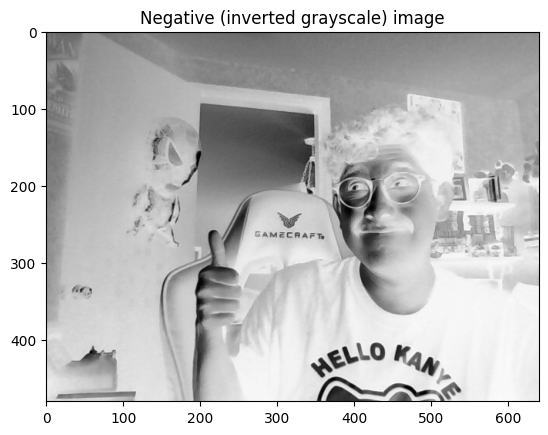

In [17]:
inv_grayscale_img = np.copy(grayscale_img)

# Getting negative image
inv_grayscale_img = 255 - grayscale_img

plt.imshow(inv_grayscale_img, cmap='gray')
plt.title('Negative (inverted grayscale) image')
plt.show()

### HSV channel displaying.

OpenCV also has the possibility to change an image to its HSV (Hue, Saturation and Value) version. This can be achieved with the same function we used to convert RGB to grayscale. The following cell displays the specified HSV channel (`0` for hue, `1` for saturation and `v` for value).

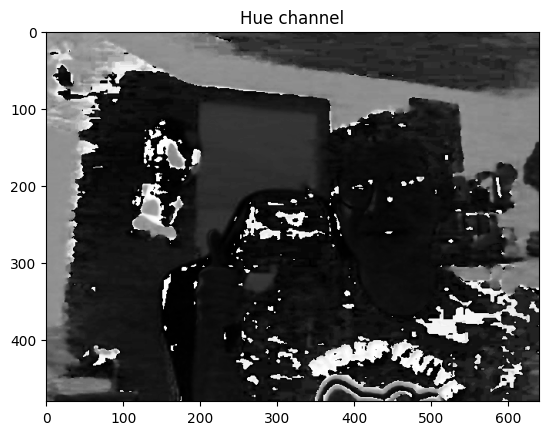

In [18]:
hsv_img = np.copy(img)

# Change from RGB to HSV
hsv_img = cv2.cvtColor(hsv_img, cv2.COLOR_RGB2HSV)

# Create filter, change channel as needed
# 0 for H, 1 for S and 2 for V
channel = 0
display_channel = hsv_img[:, :, channel]

channel_name = ''
match channel:
  case 0:
    channel_name = 'Hue'
  case 1: 
    channel_name = 'Saturation'
  case 2: 
    channel_name = 'Value'

plt.imshow(display_channel, cmap='gray')
plt.title(f'{channel_name} channel')
plt.show()

## Capture.

With the loaded images it is possible to estimate the $f$ number of the computer camera used for this notebook. However, it is also possible to take more photos using the image capture cell in the [memory and color section](#memory-and-color) and load them changing the paths in the `imread()` functions to do custom $f$ number estimations.

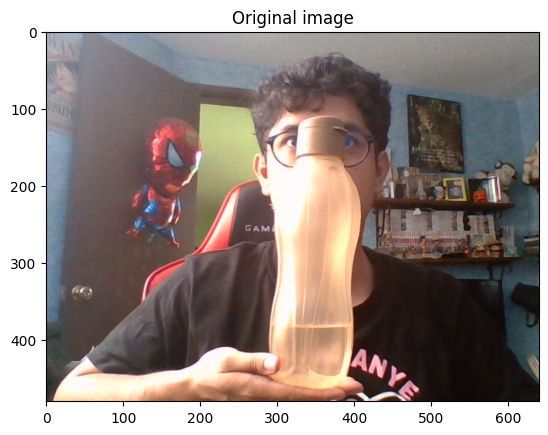

In [19]:
img = cv2.imread('capture_1723752856.1270537.png')
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

We estimate the $f$ number using the following formula:

\begin{equation}
  f=\frac{h'*d}h
  \tag{1}
\end{equation}

Where: 
* $h'$ is the height of the captured object in pixels.
* $d$ is the distance of the captured object to the camera in meters.
* $h$ is the height of the captured object in meters.

In this case the captured object was 40 cm (0.4 m) away of the camera, its height is 37 cm (0.37 m). We estimated $h'$ using the ticks from the plots; it goes from 100 pixels to 550 pixels, this gives us an approximate $h'=450\text{ pixels}$. Then, our $f$ number estimation is:

In [20]:
d = 0.4 # 40 cm = 0.4 m
h = 0.37 # 37 cm = 0.37 m
h_prime = 450 # 450 px, from approx 100 to 550 in the scale

f = (h_prime*d)/h
f

486.4864864864865

Thus, for this camera $f=486.49$.

### Testing $f$ number estimation.

We can test our $f$ number estimation by calculating the distance to the camera $d$. We capture a new image with a different object to put it to test:

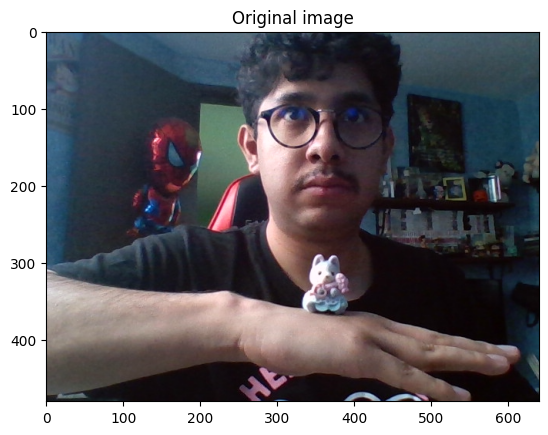

In [21]:
img = cv2.imread('capture_1723753251.4724648.png')
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

We solve for $d$ in the $f$ number formula in [(1)](#capture):

\begin{equation}
  d = \frac{h*f}{h'}
  \tag{2}
\end{equation}

In this case, the new captured object measures 3.5 cm (0.035 m) and its estimation in pixels goes from 290 to 460 pixels, then $h'=70\text{ pixels}$.

In [22]:
h = 0.035 # 3.5 cm = 0.035 m
h_prime = 70 # 70 px, from approx 290 to 460 in the scale

d_1 = (h*f)/h_prime
d_1

0.24324324324324326

In this case the estimated distance to the camera was 0.24 m which is 24 cm, the original distance was 30 cm (0.3 m).

We repeat the same process with two more new objects:

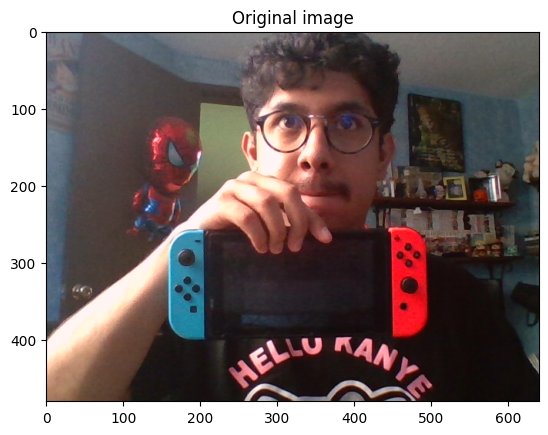

In [23]:
img = cv2.imread('capture_1723753567.056856.png')
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

In this case we have a captured object with a height of 9.5 cm (0.095 m) and and estimated $h'$ of 140 pixels (from 260 to 400 in the y-ticks scale). Then, $d$ is 0.33 m (33 cm). 

In [24]:
h = 0.095 # 9.5 cm = 0.095 m
h_prime = 140 # 40 px, from approx 260 to 400 in the scale

d_2 = (h*f)/h_prime
d_2

0.3301158301158301

The real distance for this experiment was of 40 cm (0.4 m).

We do this process one more time:

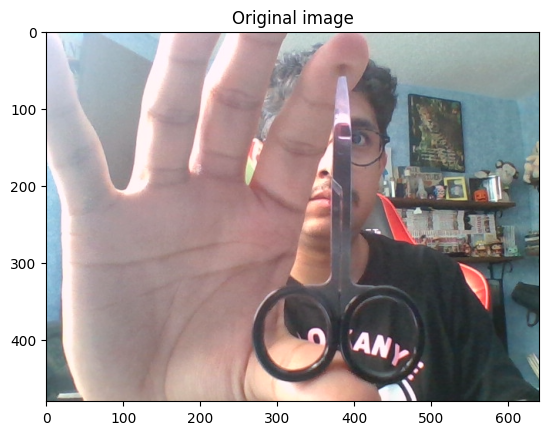

In [25]:
img = cv2.imread('capture_1723753787.1094365.png')
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

This final object has a height of 9 cm (0.09 m) and its height in pixels is 440 (from 40 to 480). This gives us a $d$ of 0.09 m (9 cm). The result gets very near of the real distance which was of 10 cm (0.1 m).

In [26]:
h = 0.09 # 9 cm = 0.09 m
h_prime = 440 # 440 px, from approx 40 to 480 in the scale

d_3 = (h*f)/h_prime
d_3

0.0995085995085995

#### Error for $d$ and $f$ estimation.

With the estimated $f$ number we calculated three different distances from the captured object to the camera. This estimated $d$'s can be compared against the real values using the formula:

\begin{equation}
  e_i = |d_i - d_i'|
  \tag{3}
\end{equation}

This is, our current error $e_i$ is calculated by the absolute value of the differences between the original distance $d_i$ and the estimated distance $d_i'$.

In [27]:
# Original distances 30, 40 and 10 cm respectively
original_d_1 = 0.3 
original_d_2 = 0.4
original_d_3 = 0.1

e_1 = np.abs(original_d_1 - d_1)
e_2 = np.abs(original_d_2 - d_2)
e_3 = np.abs(original_d_3 - d_3)

errors = [e_1, e_2, e_3]
errors

[0.05675675675675673, 0.0698841698841699, 0.0004914004914005066]

Having all the errors calculated we can compute the Mean Absolute Error to see how well our $f$ number estimation performs. MAE is calculated using: 

\begin{equation}
  \text{MAE} = \frac1N\sum_{i=1}^N|y_i-\hat{y}_i|
\end{equation}

In this case $|y_i-\hat{y}_i|=|d_i - d_i'|$, then, we just have to sum all the errors previously calculated and divide it by 3:

In [28]:
# MAE

mae = np.mean(errors)
mae

0.04237744237744238

This gives us a MAE of 0.04 which is realtively low, thus we can say our $f$ number estimation is good.

## Enhancing.

We can enhance each channel of the RGB version of the image using histogram equalization. We first load a previously taken image:

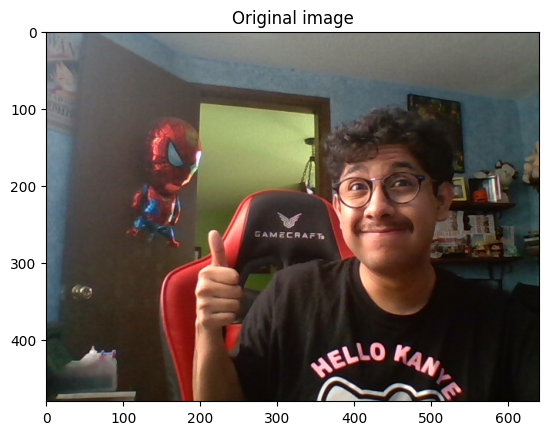

In [3]:
img = cv2.imread('capture_1723752477.6892214.png')
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

Then, to apply histogram equalization it is necessary to split all three channels from the image. We use the `equalizeHist()` function from OpenCV to equalize each channel independently. We finally merged back the channels to have an enhanced image.

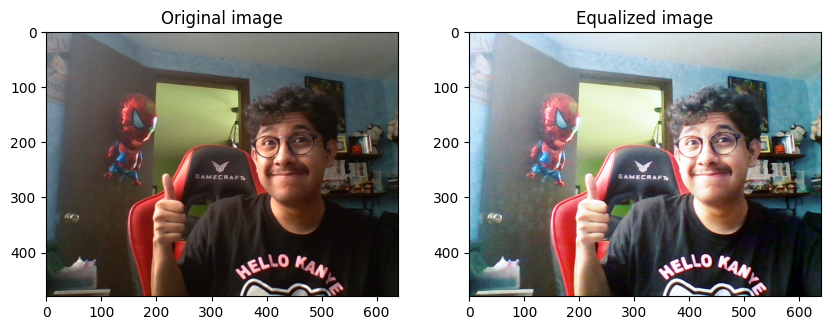

In [30]:
# Split the image into its respective R, G, B channels
r, g, b = cv2.split(img)

# Apply histogram equalization to each channel
r_eq = cv2.equalizeHist(r)
g_eq = cv2.equalizeHist(g)
b_eq = cv2.equalizeHist(b)

# Merge the equalized channels back into an RGB image
img_eq = cv2.merge([r_eq, g_eq, b_eq])

# Display the original and equalized images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_eq)
plt.title('Equalized image')

plt.show()

### HSV histogram equalization.

The same can be done with the HSV image for each channel.

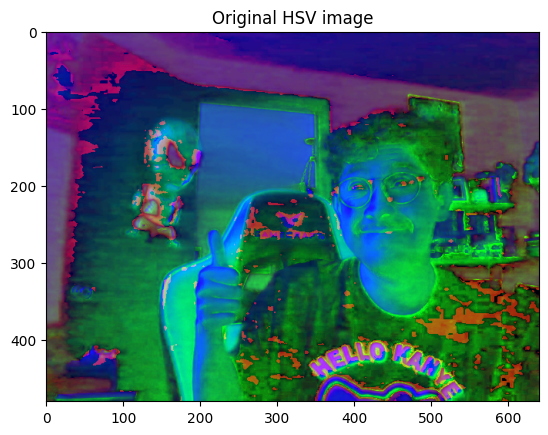

In [31]:
plt.imshow(hsv_img, cmap='gray')
plt.title('Original HSV image')

plt.show()

For this example we just enhanced the value channel.

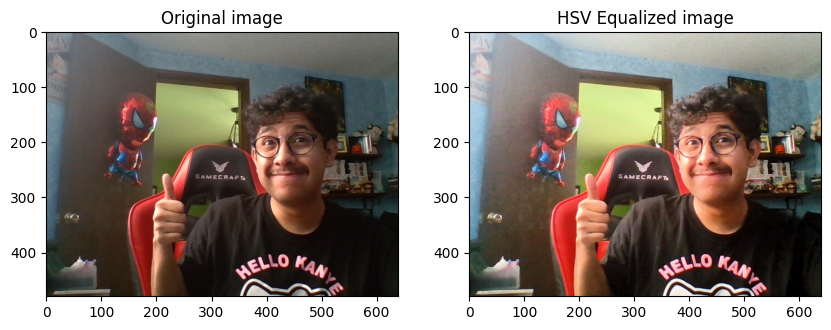

In [32]:
# Split the image into its respective H, S, V channels
h, s, v = cv2.split(hsv_img)

# Apply histogram equalization to V channel
v_eq = cv2.equalizeHist(v)

# Merge the equalized channels back into an RGB image
img_eq = cv2.merge([h, s, v_eq])
img_eq = cv2.cvtColor(img_eq, cv2.COLOR_HSV2RGB)

# Display the original and equalized images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_eq)
plt.title('HSV Equalized image')

plt.show()

### Gamma enhancing.

Another type of enhancement is the gamma enhancing. Here we define a `gamma` value, depending on it, we can enhance darker areas (`gamma = 0.5` for example) or brighter zones (`gamma = 2.0` i.e.). To apply this enhancement we need to build a lookup table to map each pixel value to its gamma-corrected value. We apply this conversion using the `LUT()` OpenCV function. 

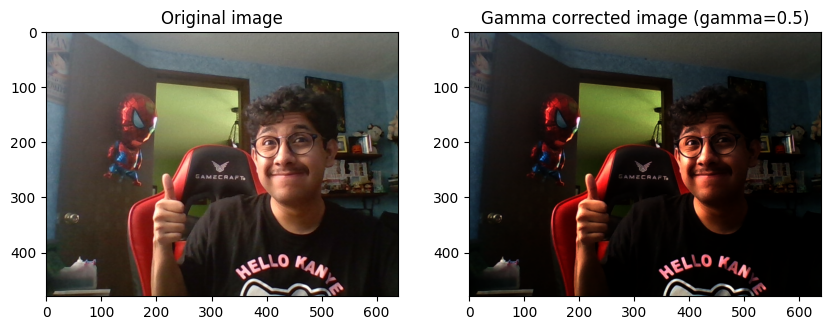

In [33]:
# Define the gamma value for enhancement (e.g., 0.5 for darker, 2.0 for brighter)
gamma = 0.5

# Build a lookup table mapping the pixel values [0, 255] to their gamma-corrected values
inv_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

# Apply gamma correction using the lookup table
img_gamma_corrected = cv2.LUT(img, table)

# Display the original and gamma-corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_gamma_corrected)
plt.title(f'Gamma corrected image (gamma={gamma})')

plt.show()

This next example uses a higher gamma value to enchance brighter areas.

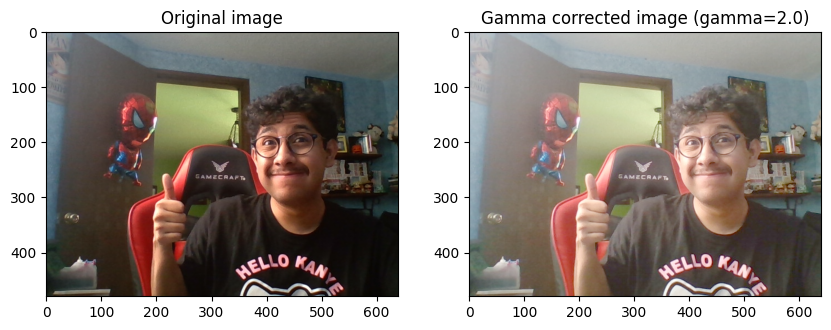

In [34]:
# Define the gamma value for enhancement (e.g., 0.5 for darker, 2.0 for brighter)
gamma = 2.0

# Build a lookup table mapping the pixel values [0, 255] to their gamma-corrected values
inv_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

# Apply gamma correction using the lookup table
img_gamma_corrected = cv2.LUT(img, table)

# Display the original and gamma-corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_gamma_corrected)
plt.title(f'Gamma corrected image (gamma={gamma})')

plt.show()

## Sampling.

Sampling is another operation that can be done with images. Here we applied the pyramid representationg. First we downsampled the image to 2, 4, 8 and 16 (`0.5`, `0.25`, `0.125` and `0.0625` in its fractional representation respectively). Then the $\frac1{16}$ representation was upscaled to its original size using different interpolations.

### Downsampling.

We first defined the scales as `[0.5, 0.25, 0.125, 0.0625]` to capture its fractional representation. The first downsampling was using the nearest neighbors interpolation. For each scale we applied the `resize()` opperation. 

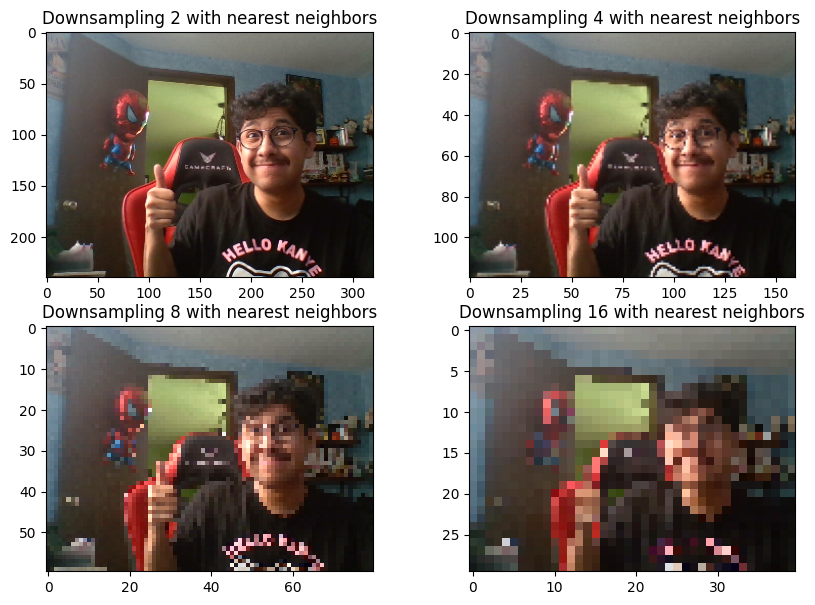

In [35]:
# Downsampling with nearest neighbors
scales = [0.5, 0.25, 0.125, 0.0625] # 2, 4, 8, 16

nn_resized_imgs = []
for scale in scales: 
  resized_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_NEAREST)
  nn_resized_imgs.append(resized_img)

# Display the downsampled images
plt.figure(figsize=(10, 7))

plt.subplot(2, 2, 1)
plt.imshow(nn_resized_imgs[0])
plt.title('Downsampling 2 with nearest neighbors')

plt.subplot(2, 2, 2)
plt.imshow(nn_resized_imgs[1])
plt.title('Downsampling 4 with nearest neighbors')

plt.subplot(2, 2, 3)
plt.imshow(nn_resized_imgs[2])
plt.title('Downsampling 8 with nearest neighbors')

plt.subplot(2, 2, 4)
plt.imshow(nn_resized_imgs[3])
plt.title('Downsampling 16 with nearest neighbors')

plt.show()

We did the same using the bilinear filtering interpolation.

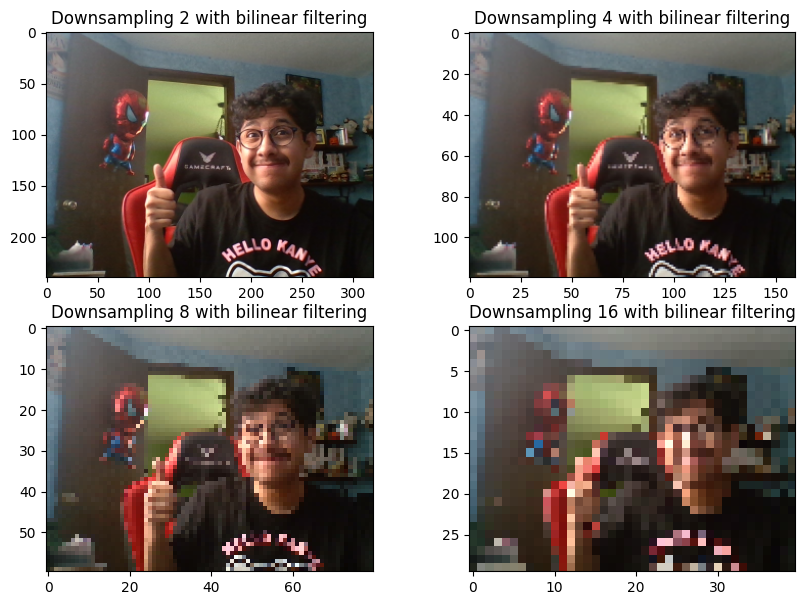

In [36]:
# Downsampling with bilinear filtering

bf_resized_imgs = []
for scale in scales: 
  resized_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
  bf_resized_imgs.append(resized_img)

# Display the downsampled images
plt.figure(figsize=(10, 7))

plt.subplot(2, 2, 1)
plt.imshow(bf_resized_imgs[0])
plt.title('Downsampling 2 with bilinear filtering')

plt.subplot(2, 2, 2)
plt.imshow(bf_resized_imgs[1])
plt.title('Downsampling 4 with bilinear filtering')

plt.subplot(2, 2, 3)
plt.imshow(bf_resized_imgs[2])
plt.title('Downsampling 8 with bilinear filtering')

plt.subplot(2, 2, 4)
plt.imshow(bf_resized_imgs[3])
plt.title('Downsampling 16 with bilinear filtering')

plt.show()

And finally using max pooling interpolation.

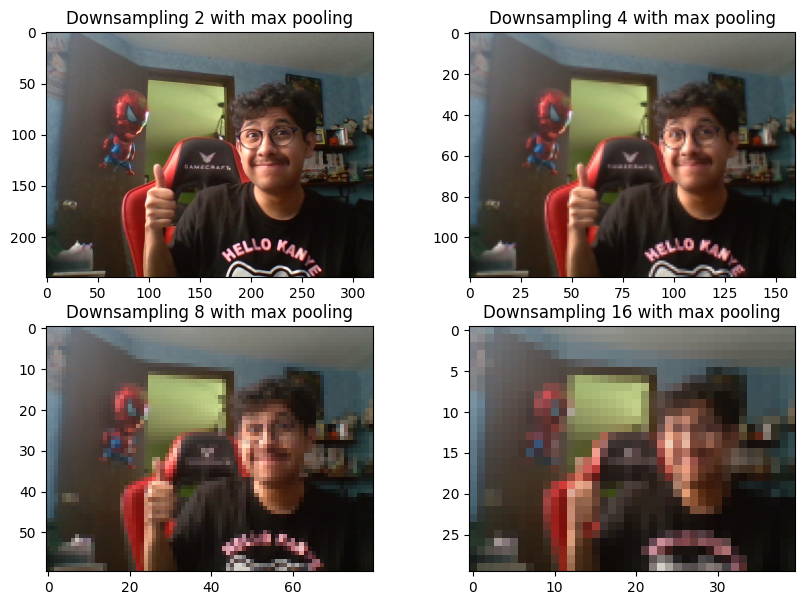

In [37]:
# Downsampling with max pooling

mp_resized_imgs = []
for scale in scales: 
  # Calculate kernel size based on the downsampling factor
  resized_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
  mp_resized_imgs.append(resized_img)

# Display the downsampled images
plt.figure(figsize=(10, 7))

plt.subplot(2, 2, 1)
plt.imshow(mp_resized_imgs[0])
plt.title('Downsampling 2 with max pooling')

plt.subplot(2, 2, 2)
plt.imshow(mp_resized_imgs[1])
plt.title('Downsampling 4 with max pooling')

plt.subplot(2, 2, 3)
plt.imshow(mp_resized_imgs[2])
plt.title('Downsampling 8 with max pooling')

plt.subplot(2, 2, 4)
plt.imshow(mp_resized_imgs[3])
plt.title('Downsampling 16 with max pooling')

plt.show()

### Upscaling.

We upscaled every `0.0625` image to its original size. We used two upsampling interpolations, first the bilinear interpolation using the `resize()`operation:

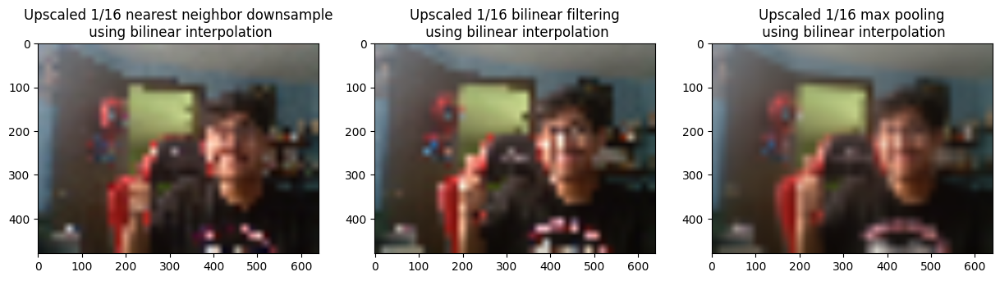

In [38]:
# Upsample 1/16 images using bilinear interpolation

nn_upscaled_img = cv2.resize(nn_resized_imgs[3], None, fx=16, fy=16, interpolation=cv2.INTER_LINEAR)
bf_upscaled_img = cv2.resize(bf_resized_imgs[3], None, fx=16, fy=16, interpolation=cv2.INTER_LINEAR)
mp_upscaled_img = cv2.resize(mp_resized_imgs[3], None, fx=16, fy=16, interpolation=cv2.INTER_LINEAR)

# Display the downsampled images
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(nn_upscaled_img)
plt.title('Upscaled 1/16 nearest neighbor downsample\n using bilinear interpolation')

plt.subplot(1, 3, 2)
plt.imshow(bf_upscaled_img)
plt.title('Upscaled 1/16 bilinear filtering\n using bilinear interpolation')

plt.subplot(1, 3, 3)
plt.imshow(mp_upscaled_img)
plt.title('Upscaled 1/16 max pooling\n using bilinear interpolation')

plt.show()

Then we implemented a SINC interpolation method. For this we firstly changed the image to its grayscale representation to then perform a Fourier transform over the image to work in the Fourier domain. We shifted the FFT to have the brighter zones at the center. Then we zero-padded the image until reaching its upscale size and placed the FFT image at the center of this new padded image. Finally we shift the FFT to its original representation and perfomr an inverse Fourier transform to have the new upscaled image. We normalize the magnitude of the image and convert it to its RGB representation.

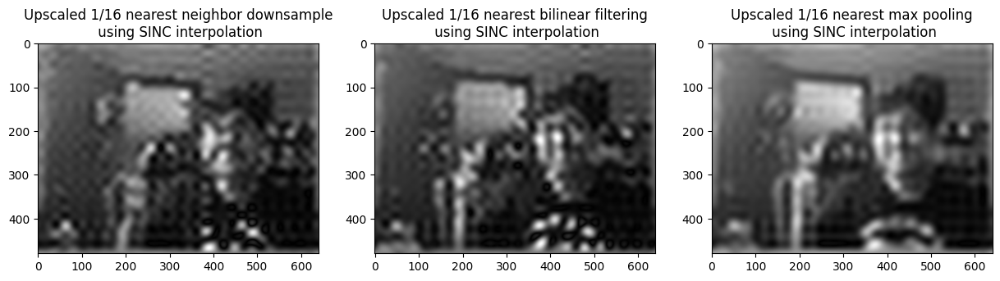

In [39]:
# Upsample 1/16 images using SINC interpolation

def sinc_interpolation_fft(image, scale_factor):
  # Convert image to grayscale if it's not already
    grayscale_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Perform FFT
    ft_img = np.fft.fft2(grayscale_img)
    ft_img_shifted = np.fft.fftshift(ft_img)

    # Get original size
    orig_size = grayscale_img.shape

    # Zero-pad the FFT image to the desired upscaled size
    padded_ft_img = np.zeros((orig_size[0] * scale_factor, orig_size[1] * scale_factor), dtype=complex)
    center_orig = np.array(orig_size) // 2
    center_pad = np.array(padded_ft_img.shape) // 2

    # Place the original FFT result in the center of the padded array
    padded_ft_img[center_pad[0] - center_orig[0]: center_pad[0] + center_orig[0],
                  center_pad[1] - center_orig[1]: center_pad[1] + center_orig[1]] = ft_img_shifted

    # Shift back before inverse FFT
    padded_ft_img_shifted_back = np.fft.ifftshift(padded_ft_img)

    # Perform inverse FFT
    upscaled_img = np.fft.ifft2(padded_ft_img_shifted_back)

    # Take magnitude and normalize
    upscaled_img_magnitude = np.abs(upscaled_img)
    upscaled_img_magnitude = np.clip(upscaled_img_magnitude, 0, 255)
    upscaled_img_magnitude = (upscaled_img_magnitude / upscaled_img_magnitude.max()) * 255
    upscaled_img_magnitude = upscaled_img_magnitude.astype(np.uint8)

    # Convert back to RGB
    upscaled_rgb_img = cv2.cvtColor(upscaled_img_magnitude, cv2.COLOR_GRAY2RGB)
    
    return upscaled_rgb_img


nn_upscaled_rgb_img = sinc_interpolation_fft(nn_resized_imgs[3], 16)
bf_upscaled_rgb_img = sinc_interpolation_fft(bf_resized_imgs[3], 16)
mp_upscaled_rgb_img = sinc_interpolation_fft(mp_resized_imgs[3], 16)

# Display the downsampled images
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(nn_upscaled_rgb_img)
plt.title('Upscaled 1/16 nearest neighbor downsample\n using SINC interpolation')

plt.subplot(1, 3, 2)
plt.imshow(bf_upscaled_rgb_img)
plt.title('Upscaled 1/16 nearest bilinear filtering\n using SINC interpolation')

plt.subplot(1, 3, 3)
plt.imshow(mp_upscaled_rgb_img)
plt.title('Upscaled 1/16 nearest max pooling\n using SINC interpolation')

plt.show()

Contrary to MATLAB, Python does not count with a pure SINC interpolation method. Thus, the results of taylor-made methods end up having too much disturbances and artifacts and may not work as expected.

## Filtering.

Filtering is another important image preprocessing operation. Here we define various filters applied to the sample image.

### Noise and blur.

We can add noise to the image using different techinques. The most popular is using a Gaussian distribution of random values into the image to add the noise filter. We defined a function that does this. 

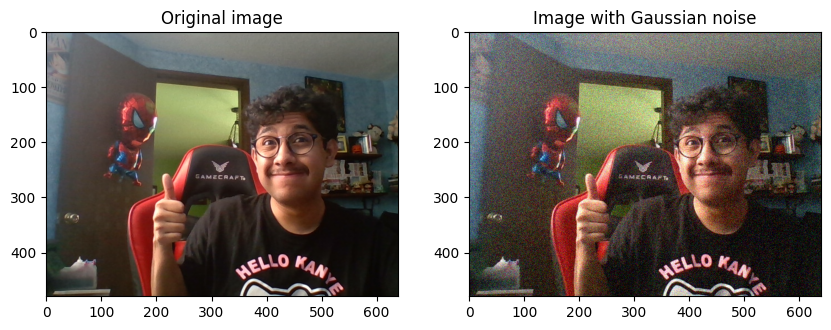

In [40]:
# Function to add Gaussian Noise
def add_gaussian_noise(image, mean=0, var=0.01):
    sigma = var**0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy_image = np.clip(image + gauss * 255, 0, 255).astype(np.uint8)
    return noisy_image

# Add Gaussian noise
noisy_image = add_gaussian_noise(img)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title(f'Image with Gaussian noise')

plt.show()


We can use different blur filters with noise. This has various implementations like data-augmentation for Deep Learning. We implemented a mean filter:

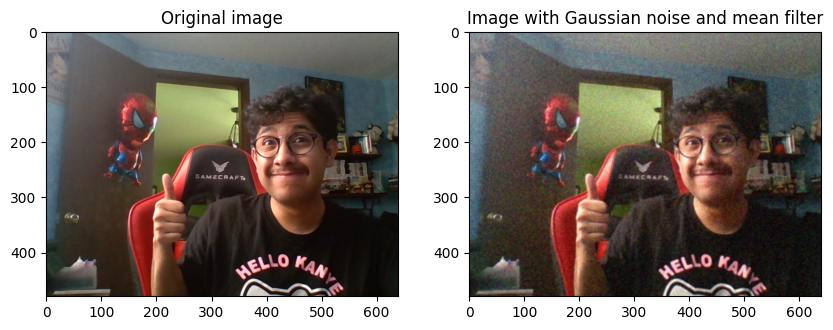

In [41]:
mean_filtered = cv2.blur(noisy_image, (3, 3))

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(mean_filtered)
plt.title(f'Image with Gaussian noise and mean filter')

plt.show()


A median blur filter:

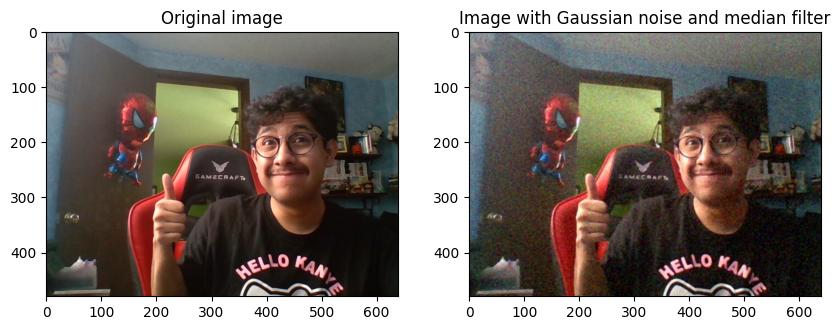

In [42]:
median_filtered = cv2.medianBlur(noisy_image, 3)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(median_filtered)
plt.title(f'Image with Gaussian noise and median filter')

plt.show()

And an anisotropic filter using the `denoise_bilateral()` function.

In [43]:
anisotropic_filtered = denoise_bilateral(noisy_image, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(anisotropic_filtered)
plt.title(f'Image with Gaussian noise and anisotropic filter')

plt.show()

Another noise technique is the salt and pepper noise. This disperses a black and white series of pixels to the image to simulate the signal perturbance. We implemented a function that uses probabilities to add black and white pixels to the image in random coordinates.

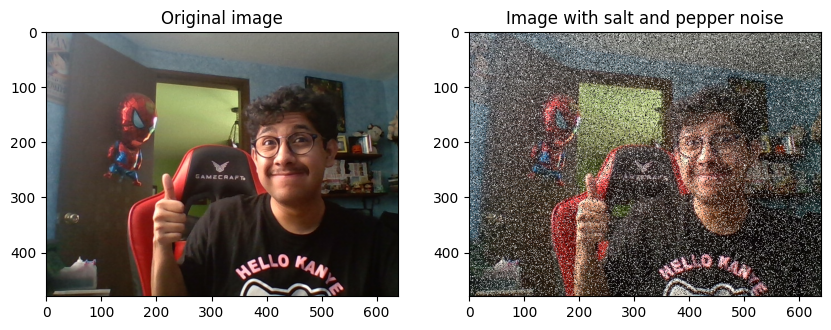

In [ ]:
# Function to add salt and pepper image
def add_salt_and_pepper_noise(image, salt_prob=0.05, pepper_prob=0.05):
  noisy_image = np.copy(image)
  salt = np.ceil(salt_prob * image.size)
  pepper = np.ceil(pepper_prob * image.size)

  # Salt
  coords = [np.random.randint(0, i - 1, int(salt)) for i in image.shape]
  noisy_image[coords[0], coords[1]] = 255

  # Pepper
  coords = [np.random.randint(0, i - 1, int(pepper)) for i in image.shape]
  noisy_image[coords[0], coords[1]] = 0

  return noisy_image

sp_noisy_image = add_salt_and_pepper_noise(img)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(sp_noisy_image)
plt.title(f'Image with salt and pepper noise')

plt.show()

We then applied the same blur filters, firstly the mean filter:

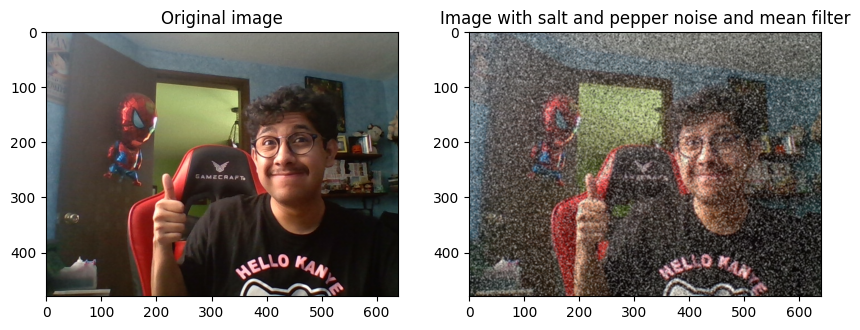

In [ ]:
mean_filtered = cv2.blur(sp_noisy_image, (3, 3))

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(mean_filtered)
plt.title(f'Image with salt and pepper noise and mean filter')

plt.show()

Then the median filter:

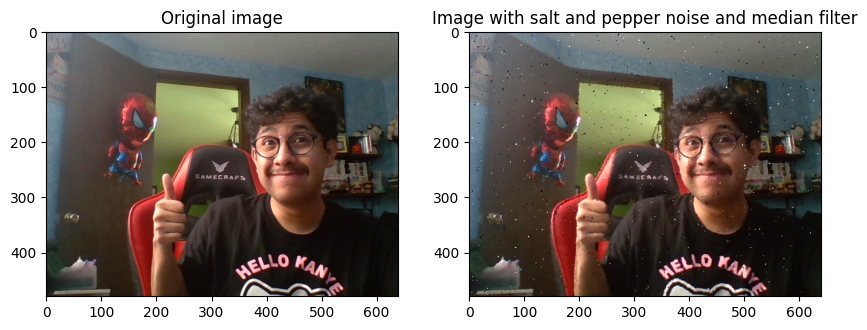

In [ ]:
median_filtered = cv2.medianBlur(sp_noisy_image, 3)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(median_filtered)
plt.title(f'Image with salt and pepper noise and median filter')

plt.show()

And finally the anisotropic filter.

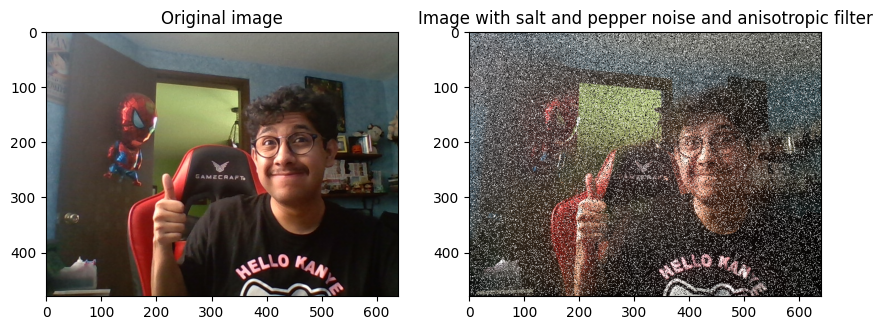

In [ ]:
anisotropic_filtered = denoise_bilateral(sp_noisy_image, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(anisotropic_filtered)
plt.title(f'Image with salt and pepper noise and anisotropic filter')

plt.show()

### Laplacian filter.

This filter measures the changes in the intensity of an image, being noise-resistant. It is used for edge detection tasks. We applied it to both RGB and grayscale images, as seen, it works better with grayscale images. OpenCV has an in-built `Laplacian()` function to apply this filter.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


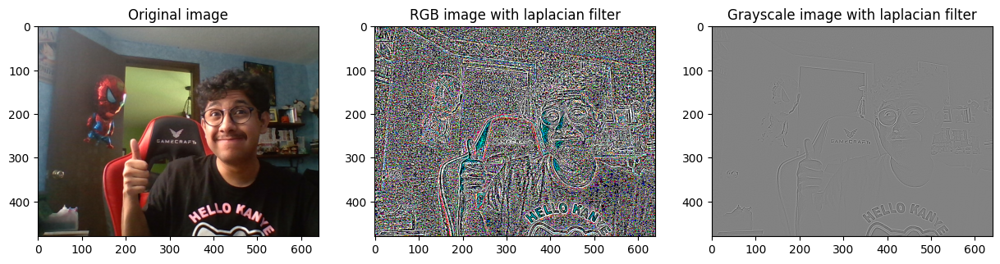

In [ ]:
grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray_laplacian_img = cv2.Laplacian(grayscale_img, cv2.CV_64F)
rgb_laplacian_img = cv2.Laplacian(img, cv2.CV_64F)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_laplacian_img)
plt.title('RGB image with laplacian filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_laplacian_img, cmap='gray')
plt.title(f'Grayscale image with laplacian filter')

plt.show()

### Sobel X.

Sobel X is another filter used for edge detection. It calculates the intensity gradient of an image. We applied the filter to an RGB and grayscale image. OpenCV has an in-built `Sobel()` function for this filter. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


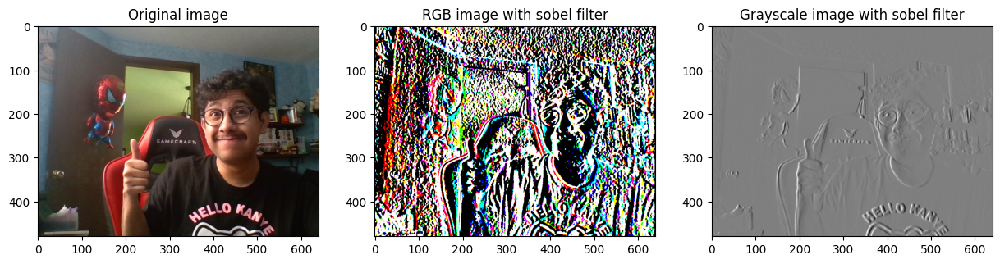

In [ ]:
gray_sobel_img = cv2.Sobel(grayscale_img, cv2.CV_64F, 1, 0, ksize=5)
rgb_sobel_img = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_sobel_img)
plt.title('RGB image with sobel filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_sobel_img, cmap='gray')
plt.title(f'Grayscale image with sobel filter')

plt.show()

### Laplacian of Gaussian.

Another border detection filter. Laplacian of Gaussian (LoG) filter takes the advantage of the Laplacian's filter ability to detect rapid intensity changes on an image and the Gaussian smoothing to avoid noise intromission. We used the funtion `gaussian_laplace` to apply this filter over the sample RGB and grayscale images.

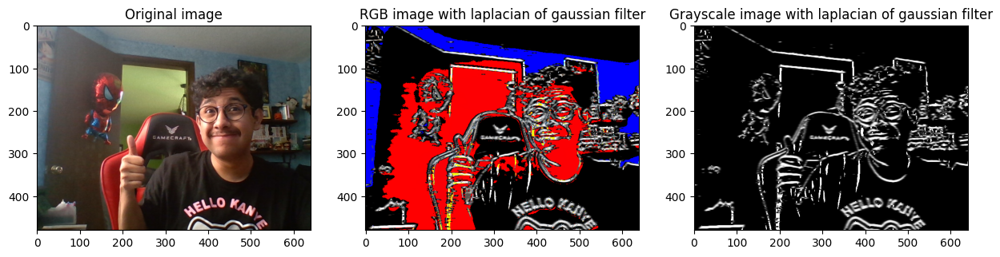

In [ ]:
gray_log_img = gaussian_laplace(grayscale_img, sigma=2)
rgb_log_img = gaussian_laplace(img, sigma=2)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_log_img)
plt.title('RGB image with laplacian of gaussian filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_log_img, cmap='gray')
plt.title(f'Grayscale image with laplacian of gaussian filter')

plt.show()

### Sharpening filter.

Sharpening filter enhances the contrast between neighboring pixels, thus, helping in edge detection tasks. It can also reduce blur and noise in images. When applied to an RGB image using the in-built `cv2.addWeighted` metho we appreciated the appreance of blur and noise in the original image. Thus, we conclude it is better to use sharpening in grayscale images.

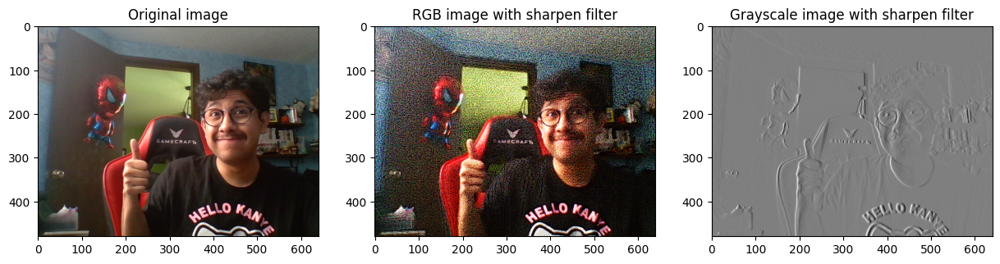

In [ ]:
gray_sharpened_img = cv2.addWeighted(grayscale_img, 1.5, gray_laplacian_img.astype(np.uint8), -0.5, 0)
rgb_sharpened_img = cv2.addWeighted(img, 1.5, rgb_laplacian_img.astype(np.uint8), -0.5, 0)

# Display the original and sharpened
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_sharpened_img)
plt.title('RGB image with sharpen filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_sobel_img, cmap='gray')
plt.title(f'Grayscale image with sharpen filter')

plt.show()

### Homomorphic filter.

Homomoprhic filtering is a more complex filter that uses a non-linear mapping of the signals of the image to another domain. We have two implementations: a 2D convolutional one where we first convert the image to its logarithmic representation, then we apply a sharpening 3x3 kernel filter and apply it using the `convolve2d` function to finally revert the logarithmic representation of the image.

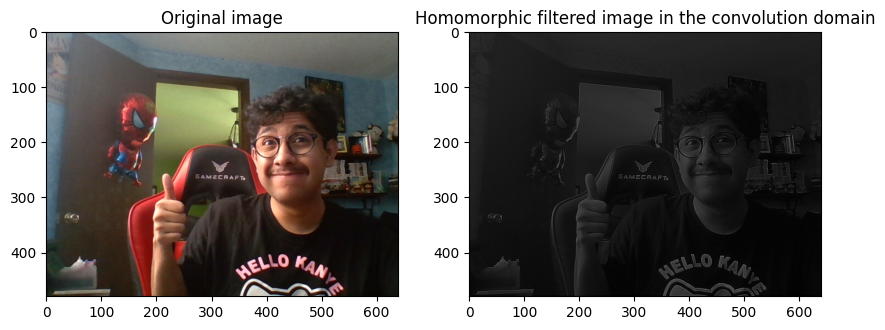

In [ ]:
# Homomorphic filter using convolutions
def homomorphic_convolution(image):
  image_double = image.astype(np.float64)

  image_log = np.log(image_double * 1000 + 10)

  sharp_filter = np.array([[-1, -1, -1], [-1, 12, -1], [-1, -1, -1]]) / 5

  image_sharp = convolve2d(image_log, sharp_filter, mode='same', boundary='wrap')

  image_sharp = np.exp(image_sharp) - 10

  image_sharp = cv2.normalize(image_sharp, None, 0, 255, cv2.NORM_MINMAX)
  image_sharp = np.uint8(image_sharp)

  return image_sharp

filtered_img = homomorphic_convolution(grayscale_img)

# Display the original and filtered images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(filtered_img, cmap='gray')
plt.title(f'Homomorphic filtered image in the convolution domain')

plt.show()

Nevertheless, it is better to use this filter within the Fourier domain. We used [the code found in this repository](https://github.com/glasgio/homomorphic-filter) to implement a homomorphic filter class. the `filter` method uses the FFT of the logarithmic representation of the image to then apply a butterworth or gaussian high pass filter to finally revert back the FFt and logarithmic representations of the image.

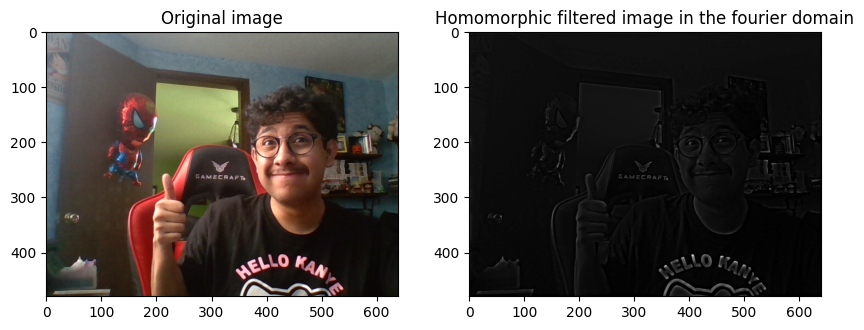

In [ ]:
# Homomorphic filter class
class HomomorphicFilter:
  def __init__(self, a = 0.5, b = 1.5):
    self.a = float(a)
    self.b = float(b)

  # Filters
  def __butterworth_filter(self, I_shape, filter_params):
    P = I_shape[0]/2
    Q = I_shape[1]/2
    U, V = np.meshgrid(range(I_shape[0]), range(I_shape[1]), sparse=False, indexing='ij')
    Duv = (((U-P)**2+(V-Q)**2)).astype(float)
    H = 1/(1+(Duv/filter_params[0]**2)**filter_params[1])
    return (1 - H)

  def __gaussian_filter(self, I_shape, filter_params):
    P = I_shape[0]/2
    Q = I_shape[1]/2
    H = np.zeros(I_shape)
    U, V = np.meshgrid(range(I_shape[0]), range(I_shape[1]), sparse=False, indexing='ij')
    Duv = (((U-P)**2+(V-Q)**2)).astype(float)
    H = np.exp((-Duv/(2*(filter_params[0])**2)))
    return (1 - H)

  # Methods
  def __apply_filter(self, I, H):
    H = np.fft.fftshift(H)
    I_filtered = (self.a + self.b*H)*I
    return I_filtered

  def filter(self, I, filter_params, filter='butterworth', H = None):
    #  Validating image
    if len(I.shape) != 2:
      raise Exception('Improper image')

    # Take the image to log domain and then to frequency domain 
    I_log = np.log1p(np.array(I, dtype="float"))
    I_fft = np.fft.fft2(I_log)

    # Filters
    if filter=='butterworth':
      H = self.__butterworth_filter(I_shape = I_fft.shape, filter_params = filter_params)
    elif filter=='gaussian':
      H = self.__gaussian_filter(I_shape = I_fft.shape, filter_params = filter_params)
    elif filter=='external':
      print('external')
      if len(H.shape) != 2:
        raise Exception('Invalid external filter')
    else:
        raise Exception('Selected filter not implemented')
    
    # Apply filter on frequency domain then take the image back to spatial domain
    I_fft_filt = self.__apply_filter(I = I_fft, H = H)
    I_filt = np.fft.ifft2(I_fft_filt)
    I = np.exp(np.real(I_filt))-1
    return np.uint8(I)

homo_filter = HomomorphicFilter()
filtered_img = homo_filter.filter(grayscale_img, filter_params=[30, 2])

# Display the original and filtered images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(filtered_img, cmap='gray')
plt.title(f'Homomorphic filtered image in the fourier domain')

plt.show()

### IIR and FIR video filter.

Infinite Impulse Response (IIR) filter uses both current and past input values, as well as past output values, to produce the current output. This means that IIR filter has a feedback mechanism, where the output is fed back into the filter. On the other hand, Finite Impulse Response (FIR) filter produces an output based solely on the current and past input values, with no feedback from past outputs. This means that FIR filters have a finite duration of influence from an impulse.

Running the cell below will initialize video capture of two frames, one with the IIR filter and the other one with the FIR filter. To stop the video capture press the _q_ key.

In [ ]:
import cv2 as cv

cap = cv.VideoCapture(0)

x = 0;

if not cap.isOpened():
    print("Cannot open camera")
    exit()

ret, frame = cap.read()
    # if frame is read correctly ret is True
if not ret:
    print("Can't receive frame (stream end?). Exiting ...")

gray2 = frame[:,:,0]
gray2.astype(float)
frame_v4 = gray2
frame_v3 = gray2
frame_v2 = gray2
frame_v1 = gray2

while True:
    x=x+1;
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    # Our operations on the frame come here
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    gray.astype(float)

    alpha=0.02
    gray2 = gray*alpha + gray2*(1.0-alpha)
    
    FIRimg = (frame_v4*0.2 + frame_v3*0.2 + frame_v2*0.2 +frame_v1*0.2 + gray*0.2);
    img = cv.normalize(FIRimg, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)
    frame_v4 = frame_v3
    frame_v3 = frame_v2
    frame_v2 = frame_v1
    frame_v1 = gray
    # Display the resulting frame
    cv.imshow('FIR',img)


    img = cv.normalize(gray2, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)
    cv.imshow('IIR', img)
    if cv.waitKey(1) == ord('q'):
        break

# When everything done, release the capture
cap.release()
cv.destroyAllWindows()


## Edge Detection.

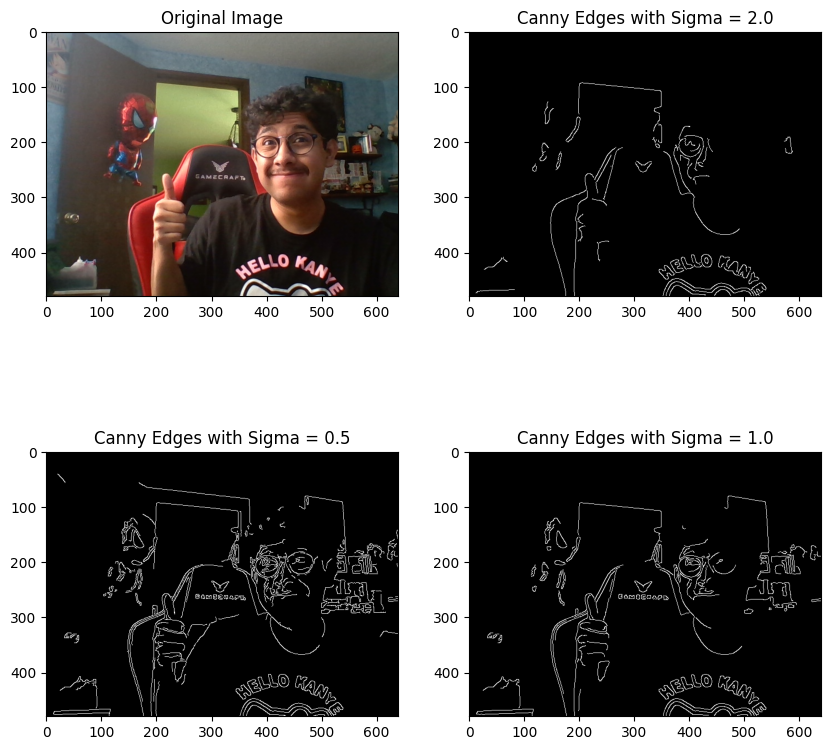

In [9]:
# Apply GaussianBlur with a configurable sigma value
sigmas = [2.0, 0.5, 1.0]
canny_imgs = []

for sigma in sigmas:
  kernel_size = int(2 * round(3 * sigma) + 1)  # Calculate kernel size based on sigma
  blurred_image = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)

  # Step 3: Apply Canny Edge Detection
  edges = cv2.Canny(blurred_image, threshold1=100, threshold2=200)
  canny_imgs.append(edges)

# Step 4: Display the original image and the edges detected
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(canny_imgs[0], cmap='gray')
plt.title(f'Canny Edges with Sigma = {sigmas[0]}')

plt.subplot(2, 2, 3)
plt.imshow(canny_imgs[1], cmap='gray')
plt.title(f'Canny Edges with Sigma = {sigmas[1]}')

plt.subplot(2, 2, 4)
plt.imshow(canny_imgs[2], cmap='gray')
plt.title(f'Canny Edges with Sigma = {sigmas[2]}')


plt.show()